<a href="https://colab.research.google.com/github/RAGHAVA1311/BATCH_05_AIML/blob/main/Updated_paddytrail_mobilenetv3_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from tensorflow.keras.layers import RandomFlip
from tensorflow.keras.utils import image_dataset_from_directory


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.17.1


In [ ]:
!pip install -q kaggle


In [ ]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"raghavgaming","key":"e93453c9d3af47cdd581e796c739d277"}'}

In [ ]:
!mkdir ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! kaggle dataset list

usage: kaggle [-h] [-v] [-W] {competitions,c,datasets,d,kernels,k,models,m,files,f,config} ...
kaggle: error: argument command: invalid choice: 'dataset' (choose from 'competitions', 'c', 'datasets', 'd', 'kernels', 'k', 'models', 'm', 'files', 'f', 'config')


In [ ]:
!kaggle competitions download -c paddy-disease-classification

paddy-disease-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip paddy-disease-classification.zip


Archive:  paddy-disease-classification.zip
replace sample_submission.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sb
import os
import warnings
warnings.filterwarnings('ignore')
from glob import glob
import tensorflow as tf
from tensorflow.keras.layers import RandomFlip
from tensorflow.keras.utils import image_dataset_from_directory

In [ ]:
df = pd.read_csv('/content/train.csv')
df.shape

(10407, 4)

In [ ]:
df.head()

,image_id,label,variety,age
0,100330.jpg,bacterial_leaf_blight,ADT45,45
1,100365.jpg,bacterial_leaf_blight,ADT45,45
2,100382.jpg,bacterial_leaf_blight,ADT45,45
3,100632.jpg,bacterial_leaf_blight,ADT45,45
4,101918.jpg,bacterial_leaf_blight,ADT45,45


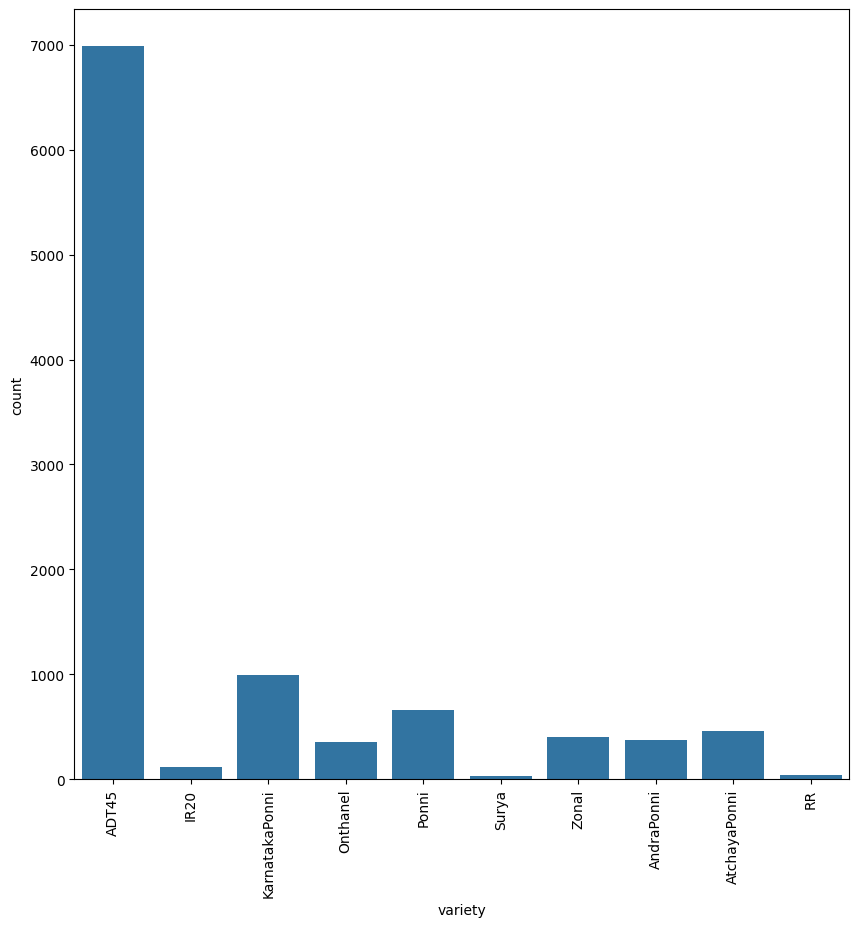

In [ ]:
plt.figure(figsize=(10,10))
sb.countplot(data=df, x='variety')
plt.xticks(rotation = 90)
plt.show()

KeyboardInterrupt: 

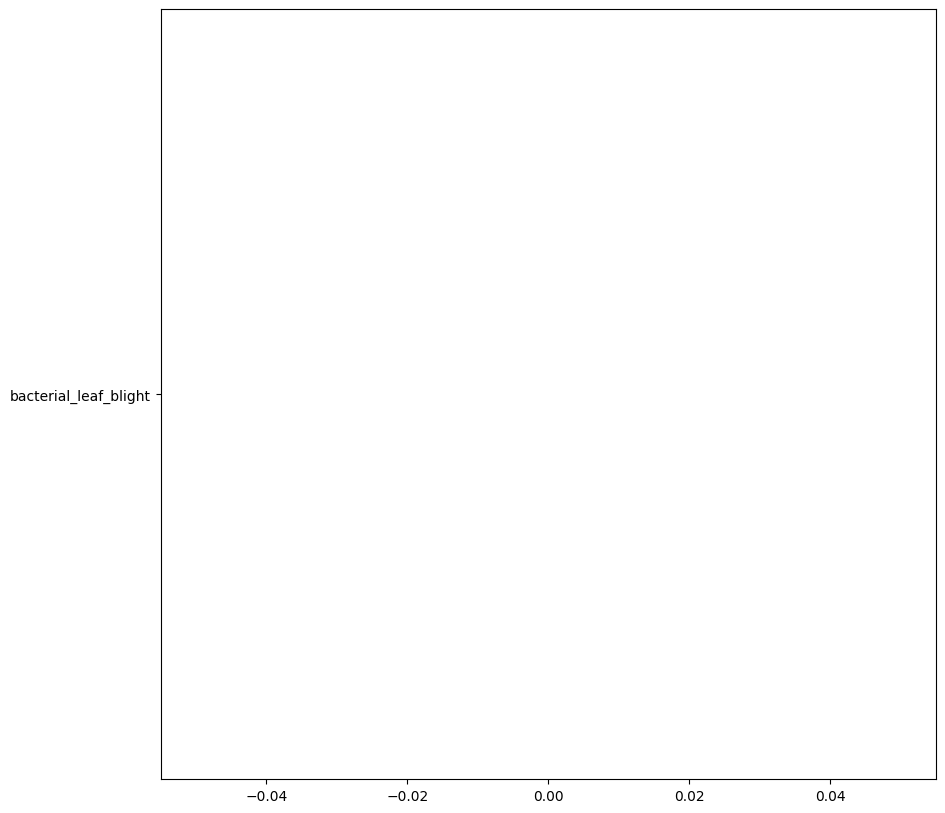

In [ ]:
plt.figure(figsize=(10,10))
sb.countplot(df['label'])
plt.xticks(rotation = 90)
plt.show()

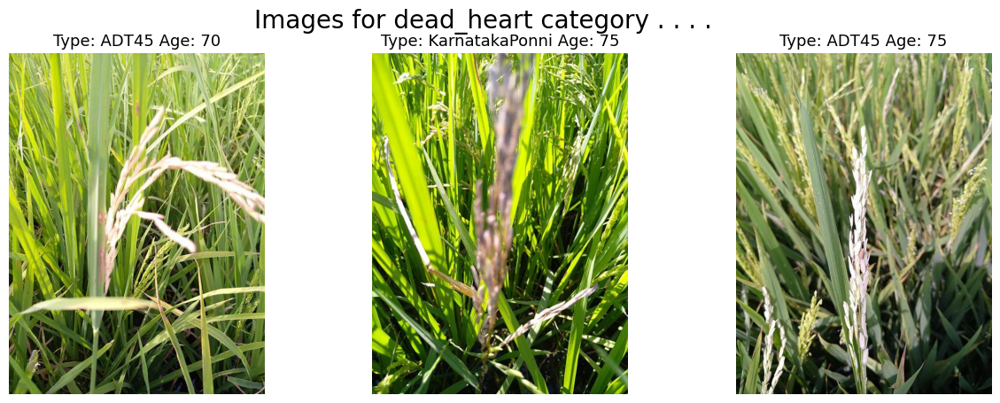

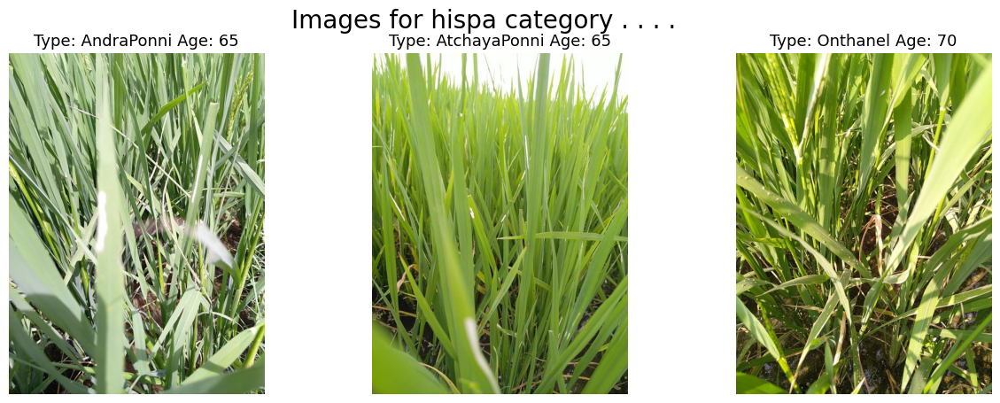

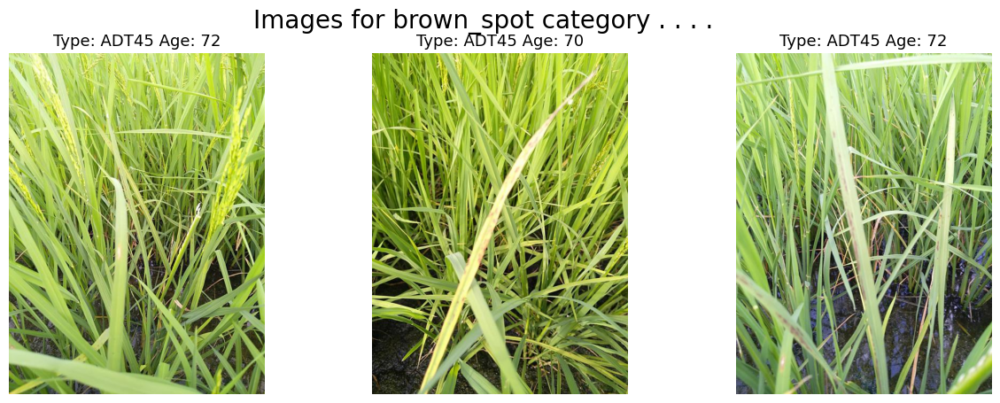

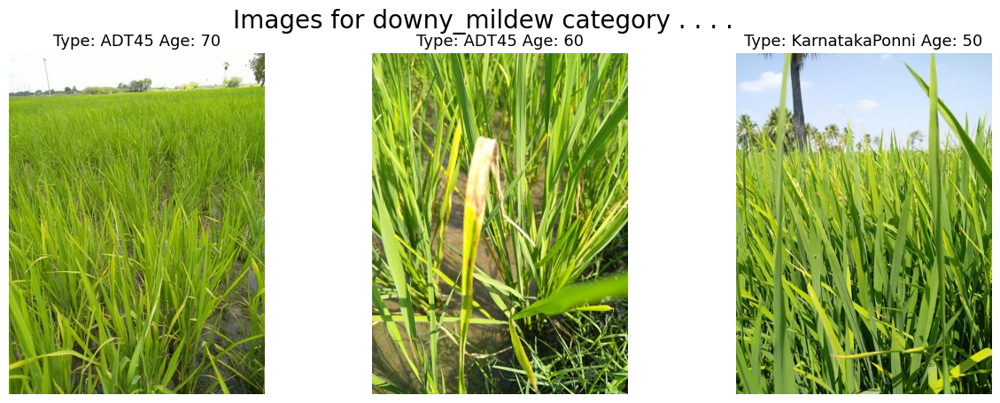

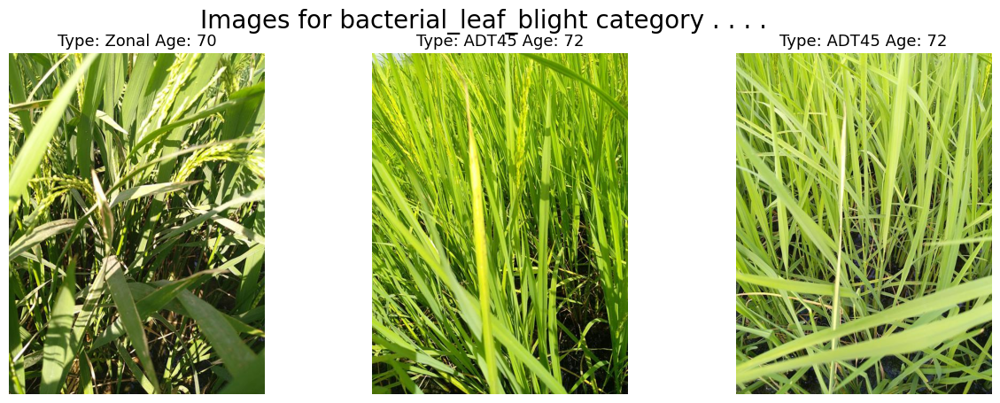

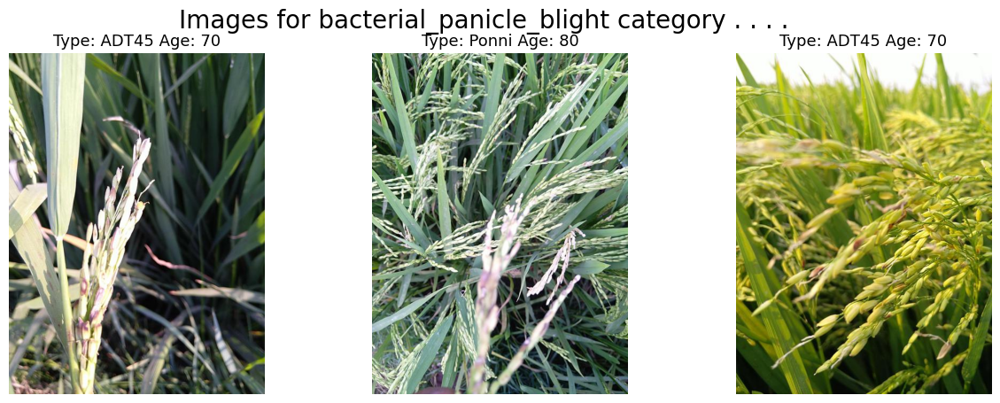

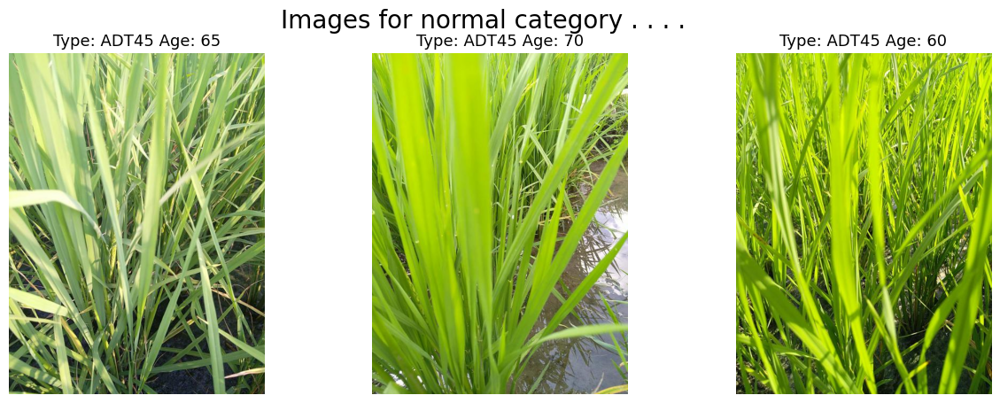

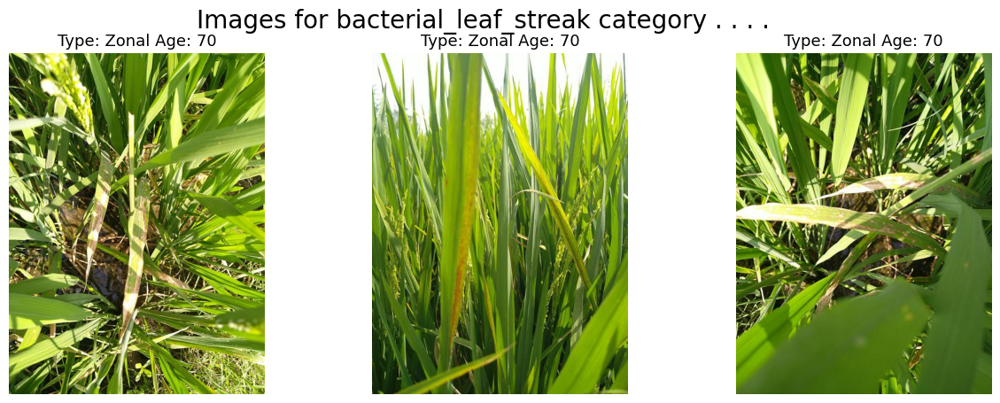

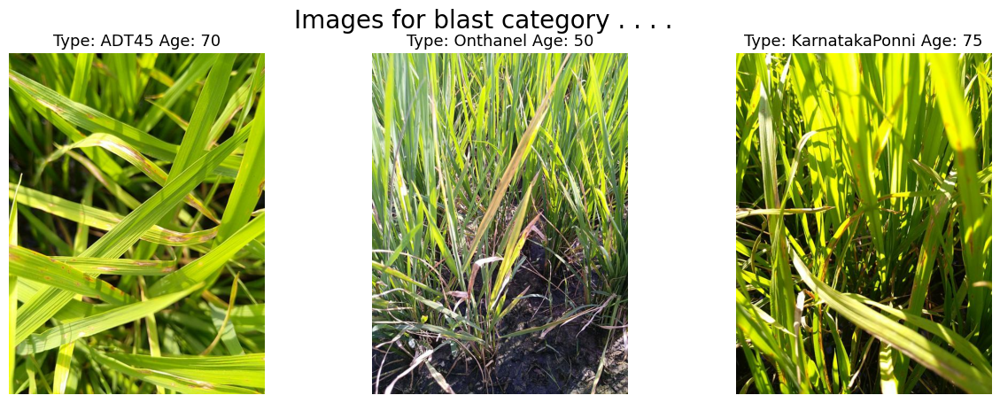

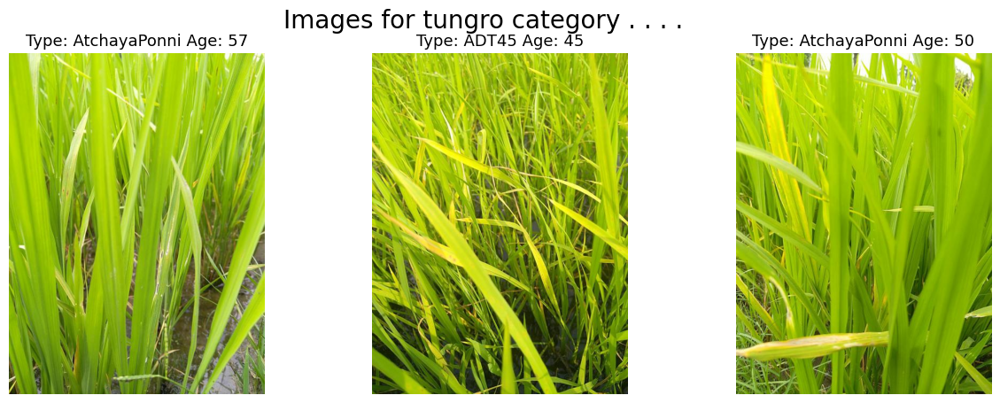

In [ ]:
base_path = '/content/train_images'
diseases = os.listdir(base_path)


for dis in diseases:
    disease_specific = df[df['label']==dis]

    index_list = disease_specific.index
    fig, ax = plt.subplots(1, 3, figsize=(15,5))
    fig.suptitle(f'Images for {dis} category . . . .', fontsize=20)
    for i in range(3):
        index = np.random.randint(0,len(index_list))
        index = index_list[index]
        data = df.iloc[index]


        image_path = f'{base_path}/{dis}/{data[0]}'

        img = np.array(Image.open(image_path))
        ax[i].imshow(img)
        ax[i].set_title(f'Type: {data[2]} Age: {data[3]}', fontsize=13)
        ax[i].axis('off')  #As all the images are of 480 x 640 dimension as per the data section.
    plt.show()

In [ ]:
labels = os.listdir('/content/train_images')
img_size = 400

train_dataset = image_dataset_from_directory(
    '/content/train_images',
    image_size = (img_size,img_size),
    batch_size = 64,
    shuffle=True,
    labels='inferred',
    class_names = labels,
    label_mode = 'categorical',
    color_mode='rgb',
    validation_split = 0.1,
    subset='training',
    seed=22
)


val_dataset = image_dataset_from_directory(
    '/content/train_images',
    image_size = (img_size,img_size),
    batch_size = 64,
    shuffle=False,
    labels='inferred',
    class_names = labels,
    label_mode = 'categorical',
    color_mode='rgb',
    validation_split = 0.1,
    subset='validation',
    seed=22
)

Found 10407 files belonging to 10 classes.
Using 9367 files for training.
Found 10407 files belonging to 10 classes.
Using 1040 files for validation.


In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)

In [ ]:
import tensorflow.keras.layers as tfl
def get_model(base, preprocessor, img_size):
    inputs = tf.keras.Input(shape=(img_size,img_size,3))
    x = RandomFlip('horizontal')(inputs)
    x = preprocessor(x)
    x = base(x)

    x = tfl.Flatten()(x)
    x = tfl.Dense(1024, activation='relu')(x)
    x = tfl.BatchNormalization()(x)
    x = tfl.Dense(512, activation='relu')(x)
    x = tfl.BatchNormalization()(x)
    x = tfl.Dense(128, activation='relu')(x)
    x = tfl.Dropout(0.15)(x)
    x = tfl.BatchNormalization()(x)
    x = tfl.Dense(64, activation='relu')(x)
    x = tfl.Dropout(0.3)(x)
    x = tfl.BatchNormalization()(x)
    outputs = tfl.Dense(10, activation='softmax')(x)

    model = tf.keras.Model(inputs, outputs)

    return model

In [ ]:
preprocess_input = tf.keras.applications.mobilenet_v3.preprocess_input

pre_trained_model = tf.keras.applications.MobileNetV3Large(input_shape=(img_size,img_size,3),
                                         include_top=False,
                                         weights='imagenet')

pre_trained_model.trainable = False

In [ ]:
model = get_model(pre_trained_model, preprocess_input, img_size)

model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
history = model.fit(train_dataset,validation_data=val_dataset,epochs=5,verbose=1)

In [ ]:
history_df = pd.DataFrame(history.history)
history_df.loc[:,['loss','val_loss']].plot()
history_df.loc[:,['accuracy','val_accuracy']].plot()
plt.show()

In [ ]:
print('Number of layers in the MobileNetV3 Model : ', len(pre_trained_model.layers))


# Here I am training the layers from 100th layer onwards.
for layer in pre_trained_model.layers[100:]:
    layer.trainable=True

In [ ]:
model_tuned = get_model(pre_trained_model, preprocess_input, img_size)

model_tuned.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
history_tuned = model_tuned.fit(train_dataset,
                    validation_data=val_dataset,
                    epochs=14,
                    verbose=1)

Epoch 1/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 114s 513ms/step - accuracy: 0.4476 - loss: 1.7566 - val_accuracy: 0.8577 - val_loss: 0.7835
Epoch 2/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 44s 301ms/step - accuracy: 0.8647 - loss: 0.5533 - val_accuracy: 0.9635 - val_loss: 0.4040
Epoch 3/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 46s 310ms/step - accuracy: 0.9489 - loss: 0.2920 - val_accuracy: 0.9837 - val_loss: 0.2331
Epoch 4/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 81s 305ms/step - accuracy: 0.9741 - loss: 0.1857 - val_accuracy: 0.9769 - val_loss: 0.1873
Epoch 5/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 45s 308ms/step - accuracy: 0.9851 - loss: 0.1272 - val_accuracy: 0.9885 - val_loss: 0.1149
Epoch 6/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 80s 295ms/step - accuracy: 0.9904 - loss: 0.0941 - val_accuracy: 0.9894 - val_loss: 0.0748
Epoch 7/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 82s 293ms/step - accuracy: 0.9914 - loss: 0.0783 - val_accuracy: 0.9923 - val_loss: 0.0458
Epoch 8/14
147/147 ━━━━━━━━━━━━━━━━━━━━ 45s 303ms/step - accuracy: 0.9951 - loss: 

In [ ]:
test_dataset = image_dataset_from_directory(
    '/content/test_images',
    image_size = (img_size,img_size),
    batch_size = 64,
    shuffle=False,
    labels=None,
    class_names = None,
    label_mode = None,
    color_mode='rgb',
)

Found 3469 files.


In [ ]:
predictions = model_tuned.predict(test_dataset)
predictions.shape

55/55 ━━━━━━━━━━━━━━━━━━━━ 23s 343ms/step


(3469, 10)

In [ ]:
ss = pd.read_csv('/content/sample_submission.csv')
ss['label'] = np.argmax(predictions, axis=-1)
ss['label'] = ss['label'].replace([0,1,2,3,4,5,6,7,8,9], labels)
ss.to_csv("Submission.csv",index=False)
ss.head()

,image_id,label
0,200001.jpg,hispa
1,200002.jpg,normal
2,200003.jpg,blast
3,200004.jpg,blast
4,200005.jpg,blast
